In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import plotly.express as px
import numpy as np
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
data_filename = "./Data_2023_24/Train_DailyData.xlsx"
idx_filename = "./Data_2023_24/Train_IndexDailyData.xlsx"
weight_filename = "./Data_2023_24/stock_weight.csv"


In [3]:
stock_data = pd.read_excel(data_filename, header=[0,1], index_col=0, parse_dates=True)
index_data = pd.read_excel(idx_filename, header=[0,1], index_col=0, parse_dates=True)
wgt_data = pd.read_csv(weight_filename, index_col=0)


In [4]:
np.random.seed(24)

In [5]:
stock_close_px = stock_data.xs('close_px',axis=1, level=1)
rand_list = np.random.choice(stock_close_px.shape[1], size=50, replace=False)
selected_stock = sorted([c for i,c in enumerate(stock_close_px.columns) if i in rand_list])

stock_close_px = stock_close_px[selected_stock].copy()
print(selected_stock)

['STOCK_10', 'STOCK_100', 'STOCK_14', 'STOCK_15', 'STOCK_17', 'STOCK_21', 'STOCK_23', 'STOCK_24', 'STOCK_25', 'STOCK_27', 'STOCK_30', 'STOCK_31', 'STOCK_32', 'STOCK_33', 'STOCK_37', 'STOCK_38', 'STOCK_39', 'STOCK_40', 'STOCK_41', 'STOCK_44', 'STOCK_45', 'STOCK_49', 'STOCK_50', 'STOCK_51', 'STOCK_52', 'STOCK_53', 'STOCK_54', 'STOCK_55', 'STOCK_58', 'STOCK_59', 'STOCK_60', 'STOCK_62', 'STOCK_67', 'STOCK_68', 'STOCK_70', 'STOCK_72', 'STOCK_73', 'STOCK_75', 'STOCK_76', 'STOCK_77', 'STOCK_78', 'STOCK_79', 'STOCK_81', 'STOCK_85', 'STOCK_87', 'STOCK_89', 'STOCK_9', 'STOCK_90', 'STOCK_91', 'STOCK_95']


In [6]:
selected_index = ["Index_0","Index_5","Index_7","Index_8"]

idx_close_px = index_data.xs('close_px',axis=1, level=1)
selected_idx_close_px = idx_close_px[selected_index].copy()

In [7]:
print(stock_close_px.shape)
print(selected_idx_close_px.shape)

(972, 50)
(972, 4)


In [8]:
stock_close_px.head(2).append(stock_close_px.tail(2))

symbol,STOCK_10,STOCK_100,STOCK_14,STOCK_15,STOCK_17,STOCK_21,STOCK_23,STOCK_24,STOCK_25,STOCK_27,...,STOCK_78,STOCK_79,STOCK_81,STOCK_85,STOCK_87,STOCK_89,STOCK_9,STOCK_90,STOCK_91,STOCK_95
date,,,,,,,,,,,,,,,,,,,,,
2019-01-02,56.881,35.772,66.880,8.992,193.714,74.427,33.142,70.207,86.127,22.360,...,200.539,312.900,64.609,4.364,10.492,40.997,182.339,5.474,11.003,35.253
2019-01-03,56.683,36.210,65.047,8.953,193.909,72.055,33.183,70.711,81.904,22.406,...,207.792,318.989,63.654,4.498,10.729,39.187,187.258,6.021,11.023,35.484
2022-12-29,80.602,47.883,105.909,18.621,781.641,92.557,33.546,215.412,52.025,64.731,...,247.800,231.766,129.670,3.789,6.697,51.480,262.728,6.632,9.975,67.688
2022-12-30,80.305,48.091,105.544,18.649,765.419,96.771,33.546,213.327,52.157,64.441,...,248.531,232.999,131.845,3.810,6.777,51.760,261.493,6.664,9.975,67.761


### Index Return

In [9]:
indices_rets = selected_idx_close_px.pct_change()
indices_cumrets = indices_rets.add(1).cumprod().sub(1)*100

fig = px.line(indices_cumrets, x=indices_cumrets.index, y=indices_cumrets.columns, title='Cumulative Returns of Indices (2019-2022)')
fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='Cumulative Return in %')
fig.show()

### Stock Return

In [10]:
stock_close_returns = stock_close_px.pct_change()
stock_close_returns_cumprod = stock_close_returns.add(1).cumprod().sub(1)*100

fig = px.line(stock_close_returns_cumprod, x=stock_close_returns_cumprod.index, y=stock_close_returns_cumprod.columns, title='Cumulative Returns of Stocks (2019-2022)')

fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='Cumulative Return in %')

fig.show()

In [11]:
stock_close_returns_cumprod.iloc[-1].sort_values()[0:5]

symbol
STOCK_62   -51.976164
STOCK_50   -47.356063
STOCK_25   -39.441755
STOCK_87   -35.407930
STOCK_79   -25.535634
Name: 2022-12-30 00:00:00, dtype: float64

In [12]:
stock_close_returns_cumprod.iloc[-1].sort_values(ascending=False)[0:5]

symbol
STOCK_77    484.420994
STOCK_45    434.946688
STOCK_17    295.128385
STOCK_49    255.405428
STOCK_24    203.854317
Name: 2022-12-30 00:00:00, dtype: float64

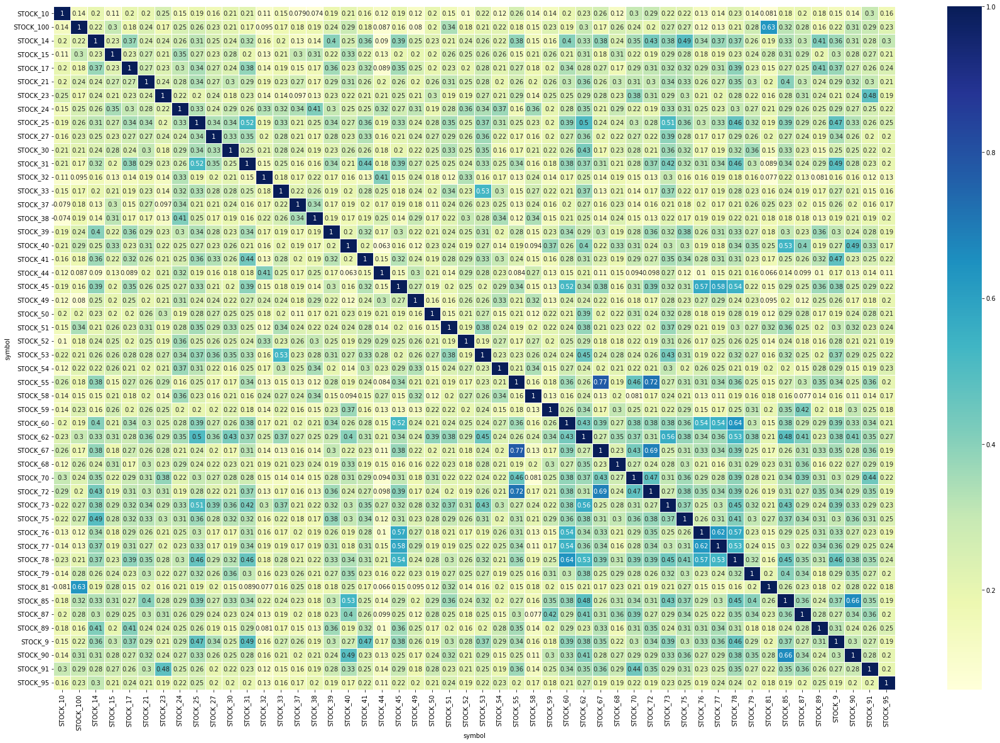

In [13]:
fig, ax = plt.subplots(figsize=(30, 20))
dataplot = sns.heatmap(stock_close_returns.corr(), cmap="YlGnBu", annot=True, linewidth=.5) 

### MVO

In [14]:

from pypfopt import risk_models
from pypfopt import expected_returns
from pypfopt.expected_returns import ema_historical_return
from pypfopt.risk_models import exp_cov
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt.plotting import plot_efficient_frontier
from pypfopt.plotting import plot_weights
from pypfopt.cla import CLA

In [15]:
train = stock_close_returns.loc[:dt.date(2022,1,1)]
test = stock_close_returns.loc[dt.date(2022,1,1):]

mu = expected_returns.ema_historical_return(train, returns_data = True, span = 500)
Sigma = risk_models.exp_cov(train, returns_data = True, span = 100)

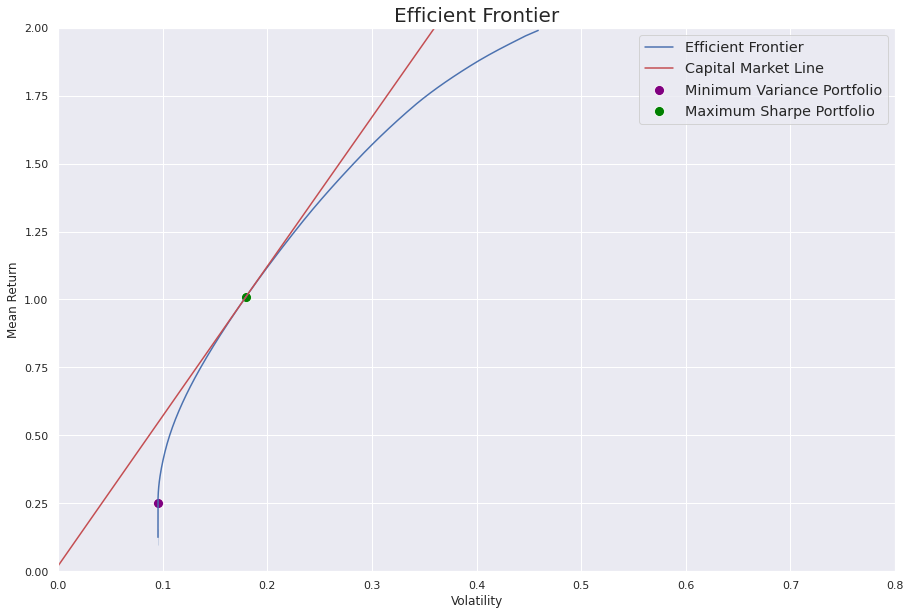

In [16]:
risk_free_rate=0.02

ret_ef = np.arange(0, 2, 0.01)
vol_ef = []
for i in np.arange(0, 2, 0.01):
    ef = EfficientFrontier(mu, Sigma)
    ef.efficient_return(i)
    vol_ef.append(ef.portfolio_performance()[1])

ef = EfficientFrontier(mu, Sigma)
ef.min_volatility()
min_vol_ret = ef.portfolio_performance()[0]
min_vol_vol = ef.portfolio_performance()[1]

ef = EfficientFrontier(mu, Sigma)
ef.max_sharpe(risk_free_rate=risk_free_rate)
max_sharpe_ret = ef.portfolio_performance()[0]
max_sharpe_vol = ef.portfolio_performance()[1]



sns.set()

fig, ax = plt.subplots(figsize = [15,10])

sns.lineplot(x = vol_ef, y = ret_ef, label = "Efficient Frontier", ax = ax)
sns.scatterplot(x = [min_vol_vol], y = [min_vol_ret], ax = ax, label = "Minimum Variance Portfolio", color = "purple", s = 100)
sns.scatterplot(x = [max_sharpe_vol], y = [max_sharpe_ret], ax = ax, label = "Maximum Sharpe Portfolio", color = "green", s = 100)


max_y_1 =(max_sharpe_ret-risk_free_rate)/max_sharpe_vol
sns.lineplot(x = [0, max_sharpe_vol, 1], y = [risk_free_rate, max_sharpe_ret, max_y_1], label = "Capital Market Line", ax = ax, color = "r")

ax.set(xlim = [0, 0.8])
ax.set(ylim = [0, 2])
ax.set_xlabel("Volatility")
ax.set_ylabel("Mean Return")
plt.legend(fontsize='large')
plt.title("Efficient Frontier", fontsize = '20')

ax.figure.savefig("EffFront_big.png", dpi = 300)

### Minimum variance portfolio

Expected annual return: 25.1%
Annual volatility: 9.5%
Sharpe Ratio: 2.54


(0.2512711818272848, 0.09549738466679847, 2.5369404897589316)

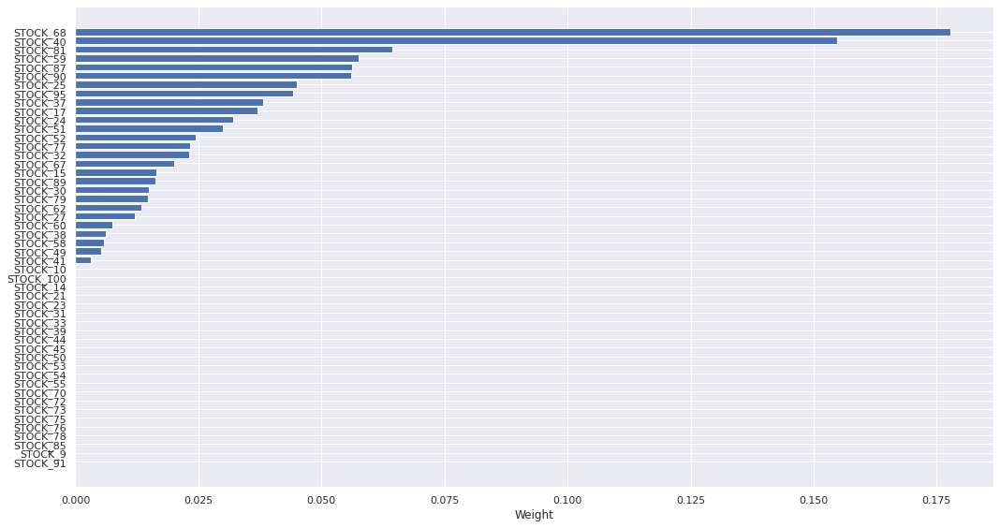

In [17]:
ef = EfficientFrontier(mu, Sigma)
raw_weights_minvar_exp = ef.min_volatility()


fig, ax = plt.subplots(figsize = [15,8])
plot_weights(raw_weights_minvar_exp, fig=fig)
ef.portfolio_performance(verbose = True, risk_free_rate = 0.009)

### Maximum Sharpe Portfolio

Expected annual return: 98.8%
Annual volatility: 17.6%
Sharpe Ratio: 5.58


(0.987641265234837, 0.1755293478052133, 5.575371169958685)

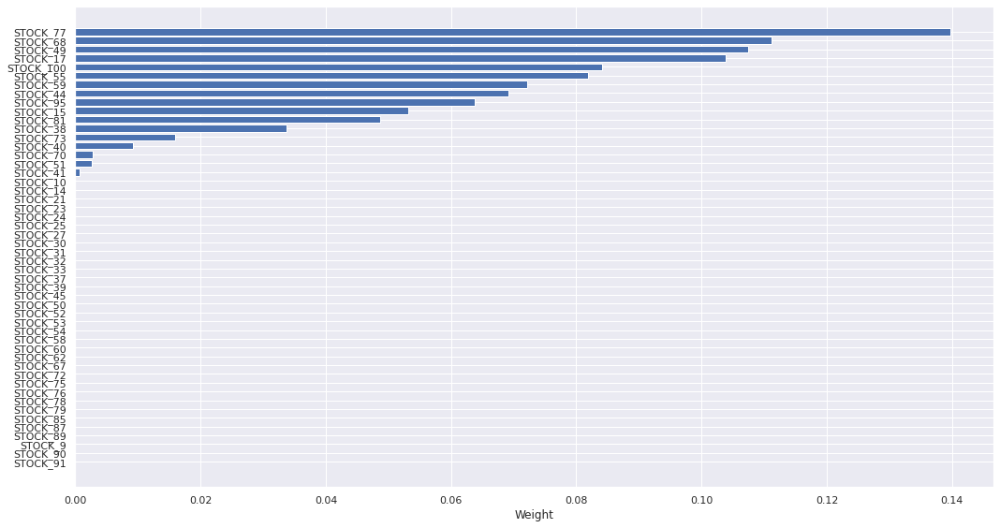

In [18]:
ef = EfficientFrontier(mu, Sigma)
raw_weights_maxsharpe_exp = ef.max_sharpe(risk_free_rate=0.009)

fig, ax = plt.subplots(figsize = [15,8])
plot_weights(raw_weights_maxsharpe_exp, fig=fig)
ef.portfolio_performance(verbose = True, risk_free_rate = 0.009)

### Backtesting

In [19]:
weights_minvar_exp = list(raw_weights_minvar_exp.values())
weights_maxsharpe_exp = list(raw_weights_maxsharpe_exp.values())

ret_1 = test.dot(weights_minvar_exp).add(1).cumprod().subtract(1).multiply(100)
ret_2 = test.dot(weights_maxsharpe_exp).add(1).cumprod().subtract(1).multiply(100)

ind_ret = selected_idx_close_px.loc[dt.date(2022,1,1):].pct_change().add(1).cumprod().subtract(1).multiply(100)

back = pd.DataFrame({"MinVar":ret_1, "MaxSharpe":ret_2})
back = pd.concat([back, ind_ret],  join = "outer", axis = 1)

In [20]:

fig = px.line(back, x = back.index, y = back.columns, title = "Portfolio Performance (2022)")
fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='Cumulative Return in %')

fig.show()